In [130]:
# import libraries

import pandas as pd # data analysis and manipulation tool
import seaborn as sns # data visualization library based on matplotlib
import numpy as np

import matplotlib #  library for creating static, animated, and interactive visualizations in Python
import matplotlib.pyplot as plt #  collection of functions that make matplotlib work like MATLAB
plt.style.use('ggplot') # to emulate R ggplot visualization style
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) #  Adjusts the configuration of the polt we will create

# Read in the data

df = pd.read_csv(r'C:\Users\abhar\Downloads\Projects\movies.csv')

In [131]:
# let's look at the data

df.head() # it shows the first 5 rows

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [132]:
# let's see if there is any missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())*100
    print('{} - {}%'.format(col, round(pct_missing,2)))

name - 0.0%
rating - 1.0%
genre - 0.0%
year - 0.0%
released - 0.03%
score - 0.04%
votes - 0.04%
director - 0.0%
writer - 0.04%
star - 0.01%
country - 0.04%
budget - 28.31%
gross - 2.46%
company - 0.22%
runtime - 0.05%


In [133]:
a =  df.isnull().sum()
print('{} - {}'.format(col, a))

runtime - name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64


In [45]:
NullValues=df.isnull().sum()/len(df)
print('{} - {}%'.format(col, round(NullValues*100,2)))

runtime - name         0.00
rating       1.00
genre        0.00
year         0.00
released     0.03
score        0.04
votes        0.04
director     0.00
writer       0.04
star         0.01
country      0.04
budget      28.31
gross        2.46
company      0.22
runtime      0.05
dtype: float64%


In [42]:
# Check data types for Columns
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [134]:
# Budget columns has an annoying .0 appendix so, let's get rid of it changing the data type

df['budget'] = df['budget'].astype('Int64')

df['gross'] = df['gross'].astype('Int64')

In [203]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Dayofrelease,yearcorrect,releaselocation
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000.0,2.847246e+09,2253,162.0,86,29,56
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000.0,2.797501e+09,1606,181.0,31,39,56
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000.0,2.201647e+09,2253,194.0,87,17,56
6663,5144,5,0,2015,698,7.8,876000.0,1125,2550,524,55,245000000.0,2.069522e+09,1540,138.0,86,35,56
7244,536,5,0,2018,192,8.4,897000.0,162,743,2241,55,321000000.0,2.048360e+09,1606,149.0,32,38,56


In [136]:
# split column into multiple columns by delimiter 
df[['0', '1']] = df['released'].str.split(',', expand=True)

In [202]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Dayofrelease,yearcorrect,releaselocation
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000.0,2.847246e+09,2253,162.0,86,29,56
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000.0,2.797501e+09,1606,181.0,31,39,56
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000.0,2.201647e+09,2253,194.0,87,17,56
6663,5144,5,0,2015,698,7.8,876000.0,1125,2550,524,55,245000000.0,2.069522e+09,1540,138.0,86,35,56
7244,536,5,0,2018,192,8.4,897000.0,162,743,2241,55,321000000.0,2.048360e+09,1606,149.0,32,38,56


In [138]:
df[['yearcorrect', 'countryofrelease']] = df['1'].str.split('(', expand=True)

In [201]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Dayofrelease,yearcorrect,releaselocation
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000.0,2.847246e+09,2253,162.0,86,29,56
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000.0,2.797501e+09,1606,181.0,31,39,56
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000.0,2.201647e+09,2253,194.0,87,17,56
6663,5144,5,0,2015,698,7.8,876000.0,1125,2550,524,55,245000000.0,2.069522e+09,1540,138.0,86,35,56
7244,536,5,0,2018,192,8.4,897000.0,162,743,2241,55,321000000.0,2.048360e+09,1606,149.0,32,38,56


In [200]:
dfdrop = df.drop('1', axis=1, inplace=True)
df.head()

KeyError: "['1'] not found in axis"

In [141]:
df['releaselocation'] = df.countryofrelease.str.replace(')', '')

C:\Users\abhar\AppData\Local\Temp\ipykernel_18616\4093891985.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df['releaselocation'] = df.countryofrelease.str.replace(')', '')


In [199]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Dayofrelease,yearcorrect,releaselocation
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000.0,2.847246e+09,2253,162.0,86,29,56
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000.0,2.797501e+09,1606,181.0,31,39,56
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000.0,2.201647e+09,2253,194.0,87,17,56
6663,5144,5,0,2015,698,7.8,876000.0,1125,2550,524,55,245000000.0,2.069522e+09,1540,138.0,86,35,56
7244,536,5,0,2018,192,8.4,897000.0,162,743,2241,55,321000000.0,2.048360e+09,1606,149.0,32,38,56


In [143]:
# let's drop a column here, axis=1 means vertical (for columns), while 0 means rows
df.drop('countryofrelease', axis=1, inplace=True) # inplace true means to do the request over the data itself. False will make a copy
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,0,1,yearcorrect,releaselocation
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,June 13,1980 (United States),1980,United States
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,July 2,1980 (United States),1980,United States
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,June 20,1980 (United States),1980,United States
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,July 2,1980 (United States),1980,United States
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,July 25,1980 (United States),1980,United States
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0,May 9,1980 (United States),1980,United States
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0,June 20,1980 (United States),1980,United States
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0,December 19,1980 (United States),1980,United States
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0,June 19,1981 (United States),1981,United States
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0,May 16,1980 (United States),1980,United States


In [198]:
# this is to rename the column made before

df.rename(columns = {'0':'Dayofrelease'}, inplace = True)
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Dayofrelease,yearcorrect,releaselocation
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000.0,2.847246e+09,2253,162.0,86,29,56
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000.0,2.797501e+09,1606,181.0,31,39,56
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000.0,2.201647e+09,2253,194.0,87,17,56
6663,5144,5,0,2015,698,7.8,876000.0,1125,2550,524,55,245000000.0,2.069522e+09,1540,138.0,86,35,56
7244,536,5,0,2018,192,8.4,897000.0,162,743,2241,55,321000000.0,2.048360e+09,1606,149.0,32,38,56


In [164]:
df = df.sort_values(by=['gross'], inplace=False, ascending=False)

In [197]:
# with this we could display all the rows
pd.set_option('display.max_rows', 0)
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Dayofrelease,yearcorrect,releaselocation
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000.0,2.847246e+09,2253,162.0,86,29,56
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000.0,2.797501e+09,1606,181.0,31,39,56
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000.0,2.201647e+09,2253,194.0,87,17,56
6663,5144,5,0,2015,698,7.8,876000.0,1125,2550,524,55,245000000.0,2.069522e+09,1540,138.0,86,35,56
7244,536,5,0,2018,192,8.4,897000.0,162,743,2241,55,321000000.0,2.048360e+09,1606,149.0,32,38,56


In [149]:
# Drop any duplicates. This command show us distinct values in the declared column

df['company'].drop_duplicates().sort_values(ascending =  False)

# with the same command minus the drop_duplicatse, we could see all the values
# df['company'].sort_values(ascending =  False)

# also if we want to drop all the duplicates, we could type:
# df['company'] = df['company'].drop_duplicates()

7129                                 thefyzz
5664                             micro_scope
6412                iDeal Partners Film Fund
4007                                i5 Films
6793                              i am OTHER
6420                                    erbp
3776                          double A Films
524                Zupnik-Curtis Enterprises
3330             Zucker Brothers Productions
146                         Zoetrope Studios
2213                      Zeta Entertainment
6222           Zentropa International Norway
3368                 Zentropa Entertainments
535                     Zenith Entertainment
5180                         Zazen Produções
                        ...                 
2760    1992 Number Four Limited Partnership
6517        1984 Private Defense Contractors
7109                              1978 Films
4412                        19 Entertainment
385                         1818 Productions
2929                           1492 Pictures
3787      

In [ ]:
# Our hypothesis are that gross profit have correlations with:
# Budget high correlation
# company high correlation
# so let`'s check it out using a scatter plot


In [166]:
# let's check if budget has some null colums
df.budget.isnull().sum()

2171

In [196]:
# 
df['gross'] = df['gross'].replace({pd.NA: np.nan})
df['budget'] = df['budget'].replace({pd.NA: np.nan})
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Dayofrelease,yearcorrect,releaselocation
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000.0,2.847246e+09,2253,162.0,86,29,56
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000.0,2.797501e+09,1606,181.0,31,39,56
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000.0,2.201647e+09,2253,194.0,87,17,56
6663,5144,5,0,2015,698,7.8,876000.0,1125,2550,524,55,245000000.0,2.069522e+09,1540,138.0,86,35,56
7244,536,5,0,2018,192,8.4,897000.0,162,743,2241,55,321000000.0,2.048360e+09,1606,149.0,32,38,56


In [169]:
# To scatter plot our data in budget and gross, we need to convert them in float or float64, otherwise we are going to get an error due to NA values

df['budget'] = df['budget'].astype('float64')
df['gross'] = df['gross'].astype('float64')

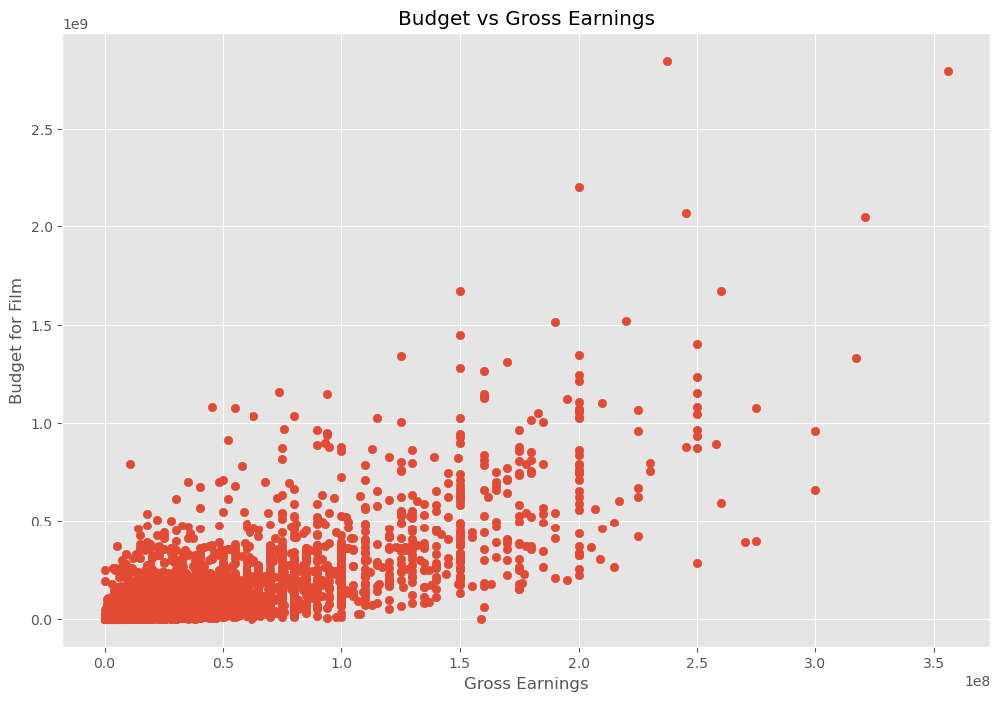

In [170]:
# Scatter plot wigh budget vs gross

plt.title('Budget vs Gross Earnings')
plt.xlabel('Gross Earnings')
plt.ylabel('Budget for Film')

plt.scatter(x=df['budget'], y=df['gross'])

In [167]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Dayofrelease,1,yearcorrect,releaselocation
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000.0,2.847246e+09,Twentieth Century Fox,162.0,December 18,2009 (United States),2009,United States
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000.0,2.797501e+09,Marvel Studios,181.0,April 26,2019 (United States),2019,United States
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000.0,2.201647e+09,Twentieth Century Fox,194.0,December 19,1997 (United States),1997,United States
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000.0,2.069522e+09,Lucasfilm,138.0,December 18,2015 (United States),2015,United States
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000.0,2.048360e+09,Marvel Studios,149.0,April 27,2018 (United States),2018,United States


<AxesSubplot:xlabel='budget', ylabel='gross'>

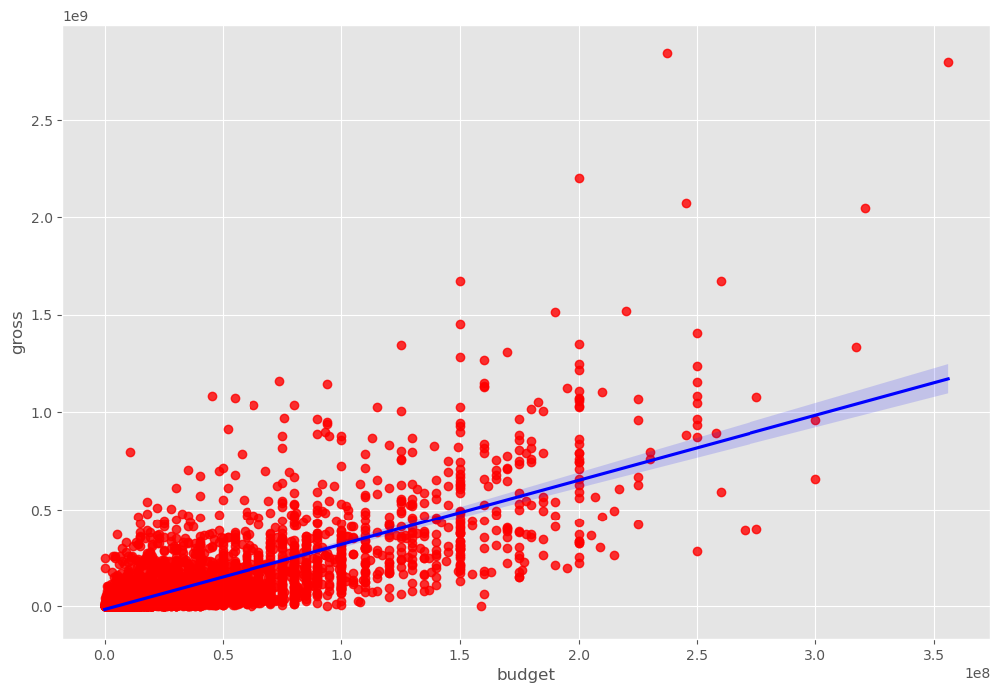

In [173]:
# Plot budget vs gross using seaborn
# we are doing a regression plot to seek correlations

sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color": "red"}, line_kws={"color": "blue"})

In [174]:
# let's check correlations
df.corr() #Pearson Correlation

#we have also kendall and Spearman correlations
# syntax is df.corr(method= 'pearson') (Pearson is the default one anyway so not need to specify)


,year,score,votes,budget,gross,runtime
year,1.000000,0.097995,0.222945,0.329321,0.257486,0.120811
score,0.097995,1.000000,0.409182,0.076254,0.186258,0.399451
votes,0.222945,0.409182,1.000000,0.442429,0.630757,0.309212
budget,0.329321,0.076254,0.442429,1.000000,0.740395,0.320447
gross,0.257486,0.186258,0.630757,0.740395,1.000000,0.245216
runtime,0.120811,0.399451,0.309212,0.320447,0.245216,1.000000


In [175]:
# High correlation between budget and gross

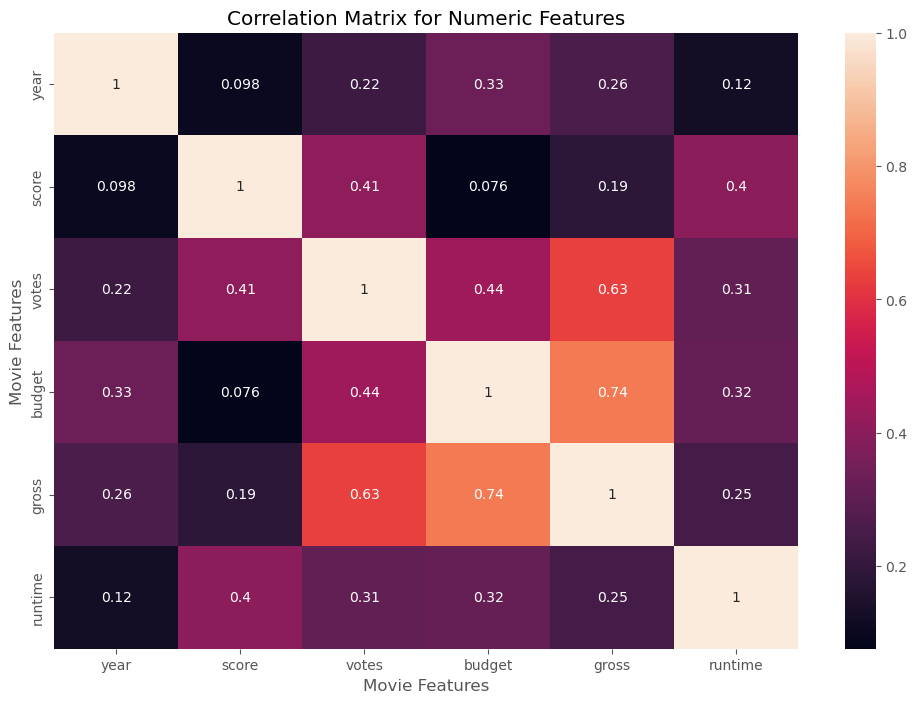

In [179]:
# let's use a visualization to identify correlations

correlation_matrix = df.corr(method= 'pearson')
sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')

plt.show()

In [195]:
# Looks at Company
# in this code, we are going to change each name (which is an object) in category
# which means we are going to have numbers
df_numerized = df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
       df_numerized[col_name] = df_numerized[col_name].astype('category')
       df_numerized[col_name] = df_numerized[col_name].cat.codes
       
df_numerized.head 

<bound method NDFrame.head of       name  rating  genre  year  released  score      votes  director  writer  \
5445   533       5      0  2009       696    7.8  1100000.0      1155    1778   
7445   535       5      0  2019       183    8.4   903000.0       162     743   
3045  6896       5      6  1997       704    7.8  1100000.0      1155    1778   
6663  5144       5      0  2015       698    7.8   876000.0      1125    2550   
7244   536       5      0  2018       192    8.4   897000.0       162     743   
7480  6194       4      2  2019      1488    6.9   222000.0      1455    1919   
6653  2969       5      0  2015      1704    7.0   593000.0       517    3568   
6043  5502       5      0  2012      2472    8.0  1300000.0      1517    2314   
6646  2145       5      0  2015       221    7.1   370000.0      1189     706   
7494  2131       4      2  2019      2676    6.8   148000.0       432    1950   
6644   534       5      0  2015      2235    7.3   777000.0      1517    2314  

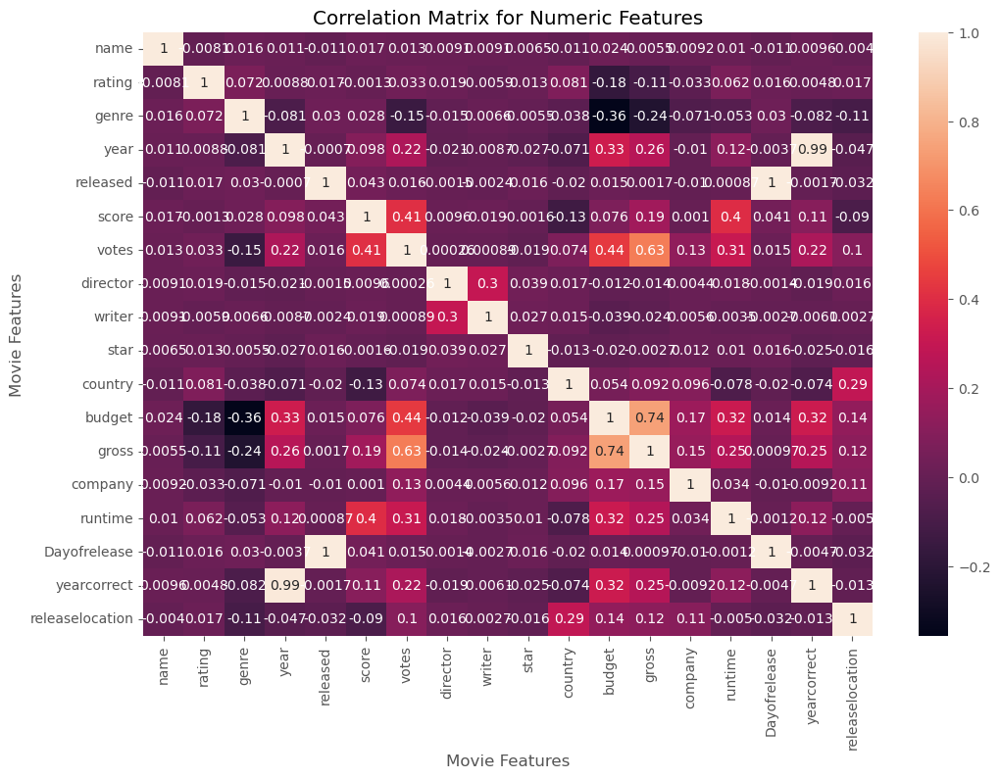

In [189]:
# the purpose of the passage above is to use those data to plot graphics. 
# if now we plot the heatmap again, we will have a wider map

correlation_matrix = df.corr(method= 'pearson')
sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')

plt.show()

In [190]:
df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,Dayofrelease,yearcorrect,releaselocation
name,1.000000,-0.008069,0.016355,0.011453,-0.011311,0.017097,0.013088,0.009079,0.009081,0.006472,-0.010737,0.023970,0.005533,0.009211,0.010392,-0.011412,0.009553,-0.004039
rating,-0.008069,1.000000,0.072423,0.008779,0.016613,-0.001314,0.033225,0.019483,-0.005921,0.013405,0.081244,-0.176002,-0.107339,-0.032943,0.062145,0.016390,0.004829,0.016953
genre,0.016355,0.072423,1.000000,-0.081261,0.029822,0.027965,-0.145307,-0.015258,0.006567,-0.005477,-0.037615,-0.356564,-0.235650,-0.071067,-0.052711,0.030043,-0.082070,-0.106374
year,0.011453,0.008779,-0.081261,1.000000,-0.000695,0.097995,0.222945,-0.020795,-0.008656,-0.027242,-0.070938,0.329321,0.257486,-0.010431,0.120811,-0.003741,0.992136,-0.046631
released,-0.011311,0.016613,0.029822,-0.000695,1.000000,0.042788,0.016097,-0.001478,-0.002404,0.015777,-0.020427,0.014683,0.001659,-0.010474,0.000868,0.999759,-0.001653,-0.032078
score,0.017097,-0.001314,0.027965,0.097995,0.042788,1.000000,0.409182,0.009559,0.019416,-0.001609,-0.133348,0.076254,0.186258,0.001030,0.399451,0.041366,0.105341,-0.089669
votes,0.013088,0.033225,-0.145307,0.222945,0.016097,0.409182,1.000000,0.000260,0.000892,-0.019282,0.073625,0.442429,0.630757,0.133204,0.309212,0.015156,0.219954,0.101995
director,0.009079,0.019483,-0.015258,-0.020795,-0.001478,0.009559,0.000260,1.000000,0.299067,0.039234,0.017490,-0.012272,-0.014441,0.004404,0.017624,-0.001446,-0.018620,0.016186
writer,0.009081,-0.005921,0.006567,-0.008656,-0.002404,0.019416,0.000892,0.299067,1.000000,0.027245,0.015343,-0.039451,-0.023519,0.005646,-0.003511,-0.002719,-0.006134,0.002692
star,0.006472,0.013405,-0.005477,-0.027242,0.015777,-0.001609,-0.019282,0.039234,0.027245,1.000000,-0.012998,-0.019589,-0.002717,0.012442,0.010174,0.016043,-0.025288,-0.015670


In [192]:
# let's read correlation as pairs

correlation_mat = df_numerized.corr()

corr_pairs = correlation_mat.unstack()

corr_pairs

name             name               1.000000
                 rating            -0.008069
                 genre              0.016355
                 year               0.011453
                 released          -0.011311
                 score              0.017097
                 votes              0.013088
                 director           0.009079
                 writer             0.009081
                 star               0.006472
                 country           -0.010737
                 budget             0.023970
                 gross              0.005533
                 company            0.009211
                 runtime            0.010392
                                      ...   
releaselocation  year              -0.046631
                 released          -0.032078
                 score             -0.089669
                 votes              0.101995
                 director           0.016186
                 writer             0.002692
          

In [193]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

genre            budget            -0.356564
budget           genre             -0.356564
genre            gross             -0.235650
gross            genre             -0.235650
rating           budget            -0.176002
budget           rating            -0.176002
genre            votes             -0.145307
votes            genre             -0.145307
score            country           -0.133348
country          score             -0.133348
rating           gross             -0.107339
gross            rating            -0.107339
genre            releaselocation   -0.106374
releaselocation  genre             -0.106374
                 score             -0.089669
                                      ...   
genre            genre              1.000000
year             year               1.000000
released         released           1.000000
score            score              1.000000
votes            votes              1.000000
yearcorrect      yearcorrect        1.000000
director  

In [194]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr

gross            votes              0.630757
votes            gross              0.630757
gross            budget             0.740395
budget           gross              0.740395
yearcorrect      year               0.992136
year             yearcorrect        0.992136
Dayofrelease     released           0.999759
released         Dayofrelease       0.999759
name             name               1.000000
Dayofrelease     Dayofrelease       1.000000
rating           rating             1.000000
genre            genre              1.000000
year             year               1.000000
released         released           1.000000
score            score              1.000000
votes            votes              1.000000
yearcorrect      yearcorrect        1.000000
director         director           1.000000
star             star               1.000000
country          country            1.000000
budget           budget             1.000000
gross            gross              1.000000
company   

In [ ]:
# Votes and budget have the highest correlation to gross earnings
# Company has Low correlation